In [ ]:


# Install the required libraries
!pip install pystan
!pip install fbprophet
!pip install hvplot
!pip install holoviews
!pip install yfinance

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 3.1 MB 7.6 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 6.4 MB 20.9 MB/s 
     |████████████████████████████████| 62 kB 967 kB/s 
  Attempting uninstall: requests
    Found existing installation: requests 2.23.0
    Uninstalling requests-2.23.0:
      Successfully uninstalled requests-2.23.0
  Attempting uninstall: lxml
    Found existing installation: lxml 4.2.6
    Uninstalling lxml-4.2.6:
      Successfully uninstalled lxml-4.2.6
ERROR: pip's dependency res

In [ ]:
# necessary import 

import yfinance as yf
import pandas as pd 
import numpy as np 
from pathlib import Path
import holoviews as hv 
import hvplot 
import hvplot.pandas
import datetime as dt 
from fbprophet import Prophet
%matplotlib inline

In [ ]:
# retrieving S&P500 data ticker 
sp500 = yf.Ticker('^GSPC')

#get stock info
sp500.info


In [ ]:
# get historical S&P500 market data 'max' period 

sp500_df = sp500.history(period='max')
sp500_df.head(10)

In [ ]:
#seperating close and volume columns to their own dataframe 
sp500_close = sp500_df.drop(columns=['Dividends', 'Stock Splits', 'Low', 'High', 'Open', 'Volume'], axis=1)

sp500_volume = sp500_df.drop(columns=['Dividends', 'Stock Splits', 'Low', 'High', 'Open', 'Close'], axis=1)

display(sp500_close)
display(sp500_volume)

In [ ]:
#Calculating the percent change of the 'Close' column to get the return as a %
sp500_close['pct_change'] = sp500_close['Close'].pct_change()
#dropping NaN values
sp500_df.dropna()
display(sp500_close)

In [ ]:
#Calculating the percent change of the 'Volume' column to get the return as a %
sp500_volume['pct_change'] = sp500_volume['Volume'].pct_change()

display(sp500_volume)

In [ ]:
#setting variables for long and short MA
short_ma = 5
long_ma = 100


#create columns for short_ma and long_ma
sp500_close['SMA_long'] = sp500_close['Close'].rolling(window = long_ma).mean()

sp500_close['SMA_short'] = sp500_close['Close'].rolling(window = short_ma).mean()



display(sp500_close.dropna())

,Close,pct_change,SMA_long,SMA_short
Date,,,,
1950-05-25,18.690001,0.000000,17.512800,18.674000
1950-05-26,18.670000,-0.001070,17.532900,18.672000
1950-05-29,18.719999,0.002678,17.551600,18.696000
1950-05-31,18.780001,0.003205,17.570100,18.710000
1950-06-01,18.770000,-0.000532,17.588000,18.726000
...,...,...,...,...
2022-06-24,3911.739990,0.030563,4245.082207,3781.397998
2022-06-27,3900.110107,-0.002973,4238.617908,3826.452002
2022-06-28,3821.550049,-0.020143,4230.939609,3837.804004


In [ ]:
#creating sp500 short dataframe 
sp500_short = sp500_close.drop(columns=['SMA_long', 'pct_change', 'Close'], axis=1)
sp500_short=sp500_short.dropna()
sp500_short

,SMA_short
Date,
1950-01-09,16.900000
1950-01-10,16.974000
1950-01-11,17.022000
1950-01-12,16.988000
1950-01-13,16.926000
...,...
2022-06-24,3781.397998
2022-06-27,3826.452002
2022-06-28,3837.804004


In [ ]:
# Using the df reset the index 
sp500_short = sp500_short.reset_index()

# Label the columns ds and y so that the syntax is recognized by Prophet
sp500_short.columns = ["ds", "y"]

# Drop an NaN values 
sp500_short = sp500_short.dropna()

# View the first and last five rows of the df
display(sp500_short.head())
display(sp500_short.tail())

,ds,y
0,1950-01-09,16.900
1,1950-01-10,16.974
2,1950-01-11,17.022
3,1950-01-12,16.988
4,1950-01-13,16.926


,ds,y
18233,2022-06-24,3781.397998
18234,2022-06-27,3826.452002
18235,2022-06-28,3837.804004
18236,2022-06-29,3849.592041
18237,2022-06-30,3847.522021


In [ ]:
# calling on phrophet function as object short model
sp500short_model = Prophet()

In [ ]:
# fitting the time series model
sp500short_model.fit(sp500_short)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [ ]:

#create dataframe to hold predictions for short_MA 
short_predictions = sp500short_model.make_future_dataframe(periods = 30, freq = 'D')
short_predictions

,ds
0,1950-01-09
1,1950-01-10
2,1950-01-11
3,1950-01-12
4,1950-01-13
...,...
18263,2022-07-26
18264,2022-07-27
18265,2022-07-28
18266,2022-07-29


In [ ]:
#make the prediction based on the short_predictions dataframe
forecast_shortma = sp500short_model.predict(short_predictions)

# preivew the tail due to most recent prices 
forecast_shortma.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
18263,2022-07-26,3715.676274,3477.078204,3944.513070,3715.676274,3715.676274,1.206059,1.206059,1.206059,-1.381811,-1.381811,-1.381811,2.587870,2.587870,2.587870,0.0,0.0,0.0,3716.882333
18264,2022-07-27,3716.240134,3481.778513,3926.095771,3716.240134,3716.240134,1.319909,1.319909,1.319909,-1.072461,-1.072461,-1.072461,2.392369,2.392369,2.392369,0.0,0.0,0.0,3717.560043
18265,2022-07-28,3716.803995,3512.388531,3954.606957,3716.803995,3716.803995,1.209096,1.209096,1.209096,-0.946567,-0.946567,-0.946567,2.155663,2.155663,2.155663,0.0,0.0,0.0,3718.013091
18266,2022-07-29,3717.367856,3492.395578,3949.147051,3717.367856,3717.367856,0.493393,0.493393,0.493393,-1.389773,-1.389773,-1.389773,1.883166,1.883166,1.883166,0.0,0.0,0.0,3717.861249
18267,2022-07-30,3717.931717,3500.986226,3947.041317,3717.931717,3717.931717,4.556833,4.556833,4.556833,2.976065,2.976065,2.976065,1.580768,1.580768,1.580768,0.0,0.0,0.0,3722.488550


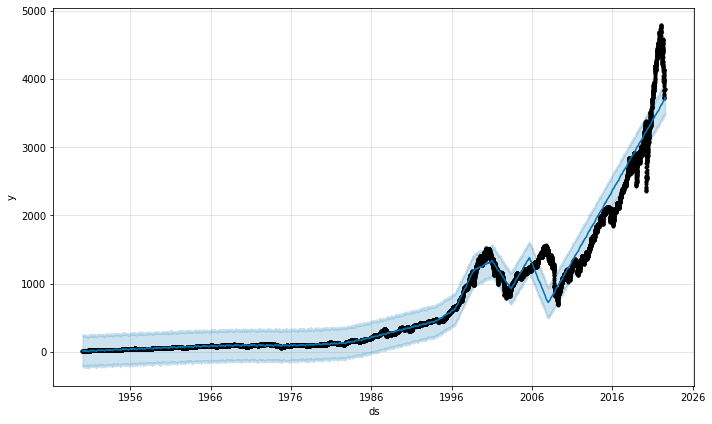

In [ ]:
#plot the predictions 
prophet_plot_pred = sp500short_model.plot(forecast_shortma)

In [ ]:
# Set the index in the forecast df to the ds datetime column
forecast_shortma = forecast_shortma.set_index('ds')

# View the only the yhat,yhat_lower and yhat_upper columns from the DataFrame
forecast_shortma[['yhat', 'yhat_lower', 'yhat_upper']]

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
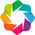

:NdOverlay   [Variable]
   :Curve   [index]   (value)

In [ ]:
hv.extension('bokeh')

forecast_shortma[['yhat','yhat_lower','yhat_upper']].hvplot(width=900, height=600,
               xlabel="Date & Time",
               ylabel="SMA_short by DAY",
               title="SMA_Short Predictions for S&P500")

In [ ]:
#creating sp500_long

sp500_long = sp500_close.drop(columns=['SMA_short', 'pct_change', 'Close'], axis=1)
sp500_long =sp500_long.dropna()
sp500_long

,SMA_long
Date,
1950-05-25,17.512800
1950-05-26,17.532900
1950-05-29,17.551600
1950-05-31,17.570100
1950-06-01,17.588000
...,...
2022-06-24,4245.082207
2022-06-27,4238.617908
2022-06-28,4230.939609


In [ ]:
# Using the sp_long df, reset the index 
sp500_long = sp500_long.reset_index()

# Label the columns ds and y so that the syntax is recognized by Prophet
sp500_long.columns = ["ds", "y"]

# Drop an NaN values from the prophet_df DataFrame
sp500_long = sp500_long.dropna()

# View the first and last five rows of the mercado_prophet_df DataFrame
display(sp500_long.head())
display(sp500_long.tail())

,ds,y
0,1950-05-25,17.5128
1,1950-05-26,17.5329
2,1950-05-29,17.5516
3,1950-05-31,17.5701
4,1950-06-01,17.5880


,ds,y
18138,2022-06-24,4245.082207
18139,2022-06-27,4238.617908
18140,2022-06-28,4230.939609
18141,2022-06-29,4224.353511
18142,2022-06-30,4217.202012


In [ ]:
# calling on phrophet function as object
sp500long_model = Prophet()

In [ ]:
# fitting the time series model
sp500long_model.fit(sp500_long)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [ ]:
#create dataframe to hold predictions for long model
long_predictions = sp500long_model.make_future_dataframe(periods = 30, freq = 'D')
long_predictions

,ds
0,1950-05-25
1,1950-05-26
2,1950-05-29
3,1950-05-31
4,1950-06-01
...,...
18168,2022-07-26
18169,2022-07-27
18170,2022-07-28
18171,2022-07-29


In [ ]:
#make the prediction based on the short_predictions dataframe
forecast_longma = sp500long_model.predict(long_predictions)

# preivew the tail due to most recent prices 
forecast_longma.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
18168,2022-07-26,3640.546132,3396.473073,3840.700201,3640.546132,3640.546132,-4.806825,-4.806825,-4.806825,-0.661141,-0.661141,-0.661141,-4.145683,-4.145683,-4.145683,0.0,0.0,0.0,3635.739307
18169,2022-07-27,3641.097333,3418.120133,3858.216113,3641.097333,3641.097333,-4.191711,-4.191711,-4.191711,-0.254355,-0.254355,-0.254355,-3.937356,-3.937356,-3.937356,0.0,0.0,0.0,3636.905623
18170,2022-07-28,3641.648535,3416.368964,3861.743696,3641.648535,3641.648535,-3.989888,-3.989888,-3.989888,-0.264768,-0.264768,-0.264768,-3.725120,-3.725120,-3.725120,0.0,0.0,0.0,3637.658647
18171,2022-07-29,3642.199736,3405.538414,3858.440349,3642.199736,3642.199736,-4.007418,-4.007418,-4.007418,-0.494448,-0.494448,-0.494448,-3.512970,-3.512970,-3.512970,0.0,0.0,0.0,3638.192318
18172,2022-07-30,3642.750937,3429.483966,3860.984270,3642.750937,3642.750937,-2.222211,-2.222211,-2.222211,1.082447,1.082447,1.082447,-3.304659,-3.304659,-3.304659,0.0,0.0,0.0,3640.528725


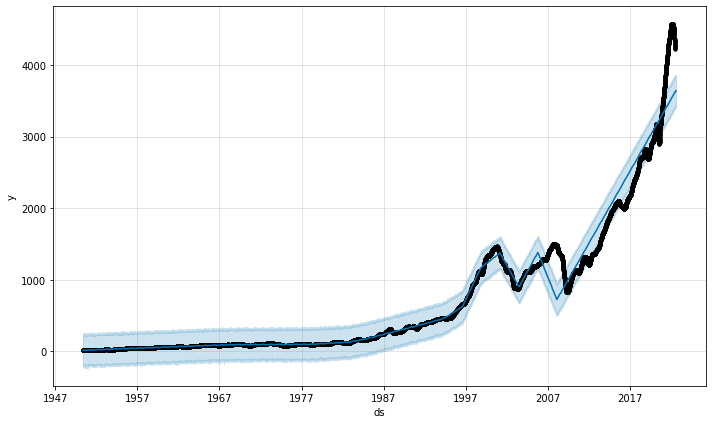

In [ ]:
#plot the predictions 
prophet_plot_pred = sp500long_model.plot(forecast_longma)

In [ ]:
# Set the index in the forecast_longm DataFrame to the ds datetime column
forecast_longma = forecast_longma.set_index('ds')

# View the only the yhat,yhat_lower and yhat_upper columns from the DataFrame
forecast_longma[['yhat', 'yhat_lower', 'yhat_upper']]

,yhat,yhat_lower,yhat_upper
ds,,,
1950-05-25,19.097078,-207.048696,234.467727
1950-05-26,18.795883,-219.712111,237.744999
1950-05-29,18.628162,-199.970291,225.296512
1950-05-31,18.795646,-179.945617,247.393276
1950-06-01,18.766691,-218.012487,237.454643
...,...,...,...
2022-07-26,3635.739307,3396.473073,3840.700201
2022-07-27,3636.905623,3418.120133,3858.216113
2022-07-28,3637.658647,3416.368964,3861.743696


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
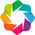

:NdOverlay   [Variable]
   :Curve   [ds]   (value)

In [ ]:
hv.extension('bokeh')

forecast_longma[['yhat','yhat_lower','yhat_upper']].hvplot(width=900, height=600,
               xlabel="Date & Time",
               ylabel="SMA_Long by DAY",
               title="SMA_Long Predictions for S&P500")